<a href="https://colab.research.google.com/github/eddie-coding/Phoneme_detection-SVM-/blob/master/Phoneme_detection_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# Any results you write to the current directory are saved as output.

#Installing kaldiio



kaldiio is an IO utility implemented in pure Python language for several file formats used in kaldi, which are named asark and scp. ark and scp are used in in order to archive some objects defined in Kaldi, typically it is Matrix object of Kaldi.

In [0]:
!pip install kaldiio

  Created wheel for kaldiio: filename=kaldiio-2.15.1-cp36-none-any.whl size=22620 sha256=567b1be9763f12da2e0e11f5884892e824689e61f8582cc35497256961eb45a2
  Stored in directory: /root/.cache/pip/wheels/8a/c8/1d/a7cefe1a964c3491603fa93c4d53f25c6612636bb29feec517
Successfully built kaldiio


# Mounting my Google Drive


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Importing the required libraries

In [0]:
import json
import kaldiio
import numpy as np
from sklearn.model_selection import train_test_split
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras import Model
import matplotlib.pyplot as plt
from sklearn import svm

from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense , Dropout , Lambda, Flatten
from keras.optimizers import Adam ,RMSprop
from sklearn.model_selection import train_test_split
from keras import  backend as K
from keras.preprocessing.image import ImageDataGenerator

from sklearn.svm import OneClassSVM

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import pickle

import numpy as np
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

Using TensorFlow backend.


# Load Train,Test and Dev from TIMIT data corpus

In [0]:
train_json_file = "kaggle/Project/input/timit/TIMIT_features/dump/train_nodev/deltafalse/data.json"
test_json_file = "kaggle/Project/input/timit/TIMIT_features/dump/test/deltafalse/data.json"
dev_json_file = "kaggle/Project/input/timit/TIMIT_features/dump/train_dev/deltafalse/data.json"

In [0]:
!ls

drive  sample_data


# Changing Directory 

In [0]:
import os
os.chdir('/content/drive/My Drive/Competitions')

# Merge all the (input,output) pairs of test, train and dev into a dictionary (merged)

In [0]:
with open(train_json_file, 'rb') as f:
    train_json = json.load(f)['utts']
with open(test_json_file, 'rb') as f:
    test_json = json.load(f)['utts']
with open(dev_json_file, 'rb') as f:
    dev_json = json.load(f)['utts']

merged = {**train_json, **test_json, **dev_json}

In [0]:
merged

{'FAEM0_SI1392': {'input': [{'feat': '/home/neo/MS/espnet/egs/timit/asr1/dump/train_nodev/deltafalse/feats.1.ark:13',
    'name': 'input1',
    'shape': [474, 13]}],
  'output': [{'name': 'target1',
    'shape': [59, 42],
    'text': 'sil ah s uw m f aa r ih sil z ae m sil p uh l ah s ih sil ch uw ey sh n w eh er f aa r m hh eh z ah sil p ae sil k iy ng sh eh sil d sil ae n sil d f iy l sil s sil',
    'token': '<space> ah s uw m f aa r ih <space> z ae m <space> p uh l ah s ih <space> ch uw ey sh n w eh er f aa r m hh eh z ah <space> p ae <space> k iy ng sh eh <space> d <space> ae n <space> d f iy l <space> s <space>',
    'tokenid': '2 5 31 36 24 16 3 30 19 2 40 4 24 2 29 35 23 5 31 19 2 9 36 15 32 25 38 13 14 16 3 30 24 18 13 40 5 2 29 4 2 22 20 26 32 13 2 10 2 4 25 2 10 16 20 23 2 31 2'}],
  'utt2spk': 'FAEM0'},
 'FAEM0_SI2022': {'input': [{'feat': '/home/neo/MS/espnet/egs/timit/asr1/dump/train_nodev/deltafalse/feats.1.ark:6313',
    'name': 'input1',
    'shape': [223, 13]}],
  'ou

# Downloading all the alignments

In [0]:
!wget https://raw.githubusercontent.com/sknadig/kaldi/port_aligns/egs/timit/s5/alignments -O alignments
with open("alignments", "r") as f:
    contents = f.readlines()

--2020-03-26 17:50:12--  https://raw.githubusercontent.com/sknadig/kaldi/port_aligns/egs/timit/s5/alignments
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3771623 (3.6M) [text/plain]
Saving to: ‘alignments’

alignments          100%[===================>]   3.60M  --.-KB/s    in 0.1s    

2020-03-26 17:50:13 (28.4 MB/s) - ‘alignments’ saved [3771623/3771623]



In [0]:
contents

['MDLC1_SI1435 sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil dh dh dh dh ih ih ih w w w w w w w w w w w w w w w w er er er er er er l l l l sil sil sil sil sil sil ih ih ih ih ih ih z z z z z z z sil sil sil k k k k k k aa aa aa aa aa aa aa aa aa aa aa aa n n n s s s s s s s s s s s ah ah ah n n n n n l l l l l l l l iy iy iy iy iy sil sil sil sil sil sil ch ch ch ch ch ch ch ch ch ch ey ey ey ey ey ey ey ey ey ey ey ey ey n n n sil sil sil jh jh jh jh jh ih ih ih ih ng ng ng ng ng ng ng ng sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil hh hh hh w w w w w w ah ah ah ah ah w w w w w w w w w w w w w ah ah ah ah z z z z z z sil sil sil n n n n n n n uw uw uw uw uw uw uw uw y y y y y y y y y y y y eh eh eh eh eh eh eh s s s s sil sil sil t t t t t er er er sil sil sil sil sil d d d d iy iy iy iy iy iy iy iy iy iy iy iy iy iy iy iy iy iy sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil sil 

# Creating a dictionary frame_level_dict

*   keys = utterance id's
*   values = utterance labels





In [0]:
frame_level_dict = {}
for row in contents:
    row = row.strip().split(" ")
    uttid = row[0]
    alignments = row[1:]
    frame_level_dict[uttid] = alignments

In [0]:
frame_level_dict

{'MDLC1_SI1435': ['sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'dh',
  'dh',
  'dh',
  'dh',
  'ih',
  'ih',
  'ih',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'w',
  'er',
  'er',
  'er',
  'er',
  'er',
  'er',
  'l',
  'l',
  'l',
  'l',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'sil',
  'ih',
  'ih',
  'ih',
  'ih',
  'ih',
  'ih',
  'z',
  'z',
  'z',
  'z',
  'z',
  'z',
  'z',
  'sil',
  'sil',
  'sil',
  'k',
  'k',
  'k',
  'k',
  'k',
  'k',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'aa',
  'n',
  'n',
  'n',
  's',
  's',
  's',
  's',
  's',
  's',
  's',
  's',
  's',
  's',
  's',
  'ah',
  'ah',
  'ah',
  'n',
  'n',
  'n',
  'n',
  'n',
  'l',
  'l',
  'l',
  'l',
  'l',
  'l',
  'l',
  'l',
  'iy',
  'iy',
  'iy',
  'iy',
  'iy',
  'sil',
  'sil',
  'sil',


# Creating utt_labels and flat_labels

*  utt_labels: a list of lists of all utterance labels 
*  flat_labels: a list of all utterance labels 



In [0]:
utt_labels = frame_level_dict.values()
flat_labels = [val for sublist in utt_labels for val in sublist]

In [0]:
utt_labels

dict_values([['sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'dh', 'dh', 'dh', 'dh', 'ih', 'ih', 'ih', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'w', 'er', 'er', 'er', 'er', 'er', 'er', 'l', 'l', 'l', 'l', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'ih', 'ih', 'ih', 'ih', 'ih', 'ih', 'z', 'z', 'z', 'z', 'z', 'z', 'z', 'sil', 'sil', 'sil', 'k', 'k', 'k', 'k', 'k', 'k', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'aa', 'n', 'n', 'n', 's', 's', 's', 's', 's', 's', 's', 's', 's', 's', 's', 'ah', 'ah', 'ah', 'n', 'n', 'n', 'n', 'n', 'l', 'l', 'l', 'l', 'l', 'l', 'l', 'l', 'iy', 'iy', 'iy', 'iy', 'iy', 'sil', 'sil', 'sil', 'sil', 'sil', 'sil', 'ch', 'ch', 'ch', 'ch', 'ch', 'ch', 'ch', 'ch', 'ch', 'ch', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'ey', 'n', 'n', 'n', 'sil', 'sil', 'sil', 'jh', 'jh', 'jh', 'jh', 'jh', 'ih', 'ih', 'ih', 'ih', 'ng', '

In [0]:
flat_labels

['sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'dh',
 'dh',
 'dh',
 'dh',
 'ih',
 'ih',
 'ih',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'w',
 'er',
 'er',
 'er',
 'er',
 'er',
 'er',
 'l',
 'l',
 'l',
 'l',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'ih',
 'ih',
 'ih',
 'ih',
 'ih',
 'ih',
 'z',
 'z',
 'z',
 'z',
 'z',
 'z',
 'z',
 'sil',
 'sil',
 'sil',
 'k',
 'k',
 'k',
 'k',
 'k',
 'k',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'aa',
 'n',
 'n',
 'n',
 's',
 's',
 's',
 's',
 's',
 's',
 's',
 's',
 's',
 's',
 's',
 'ah',
 'ah',
 'ah',
 'n',
 'n',
 'n',
 'n',
 'n',
 'l',
 'l',
 'l',
 'l',
 'l',
 'l',
 'l',
 'l',
 'iy',
 'iy',
 'iy',
 'iy',
 'iy',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'sil',
 'ch',
 'ch',
 'ch',
 'ch',
 'ch',
 'ch',
 'ch',
 'ch',
 'ch',
 'ch',
 'ey',
 'ey',
 'ey',
 'ey',
 'ey',
 'ey',
 'ey',


# Create a list of all the unique labels and then assign each phoneme a integer value

In [0]:
uniq_labels = list(sorted(set(flat_labels)))
phone_to_int = dict(zip(uniq_labels, np.arange(len(uniq_labels))))

In [0]:
uniq_labels

['aa',
 'ae',
 'ah',
 'aw',
 'ay',
 'b',
 'ch',
 'd',
 'dh',
 'dx',
 'eh',
 'er',
 'ey',
 'f',
 'g',
 'hh',
 'ih',
 'iy',
 'jh',
 'k',
 'l',
 'm',
 'n',
 'ng',
 'ow',
 'oy',
 'p',
 'r',
 's',
 'sh',
 'sil',
 't',
 'th',
 'uh',
 'uw',
 'v',
 'w',
 'y',
 'z']

In [0]:
phone_to_int

{'aa': 0,
 'ae': 1,
 'ah': 2,
 'aw': 3,
 'ay': 4,
 'b': 5,
 'ch': 6,
 'd': 7,
 'dh': 8,
 'dx': 9,
 'eh': 10,
 'er': 11,
 'ey': 12,
 'f': 13,
 'g': 14,
 'hh': 15,
 'ih': 16,
 'iy': 17,
 'jh': 18,
 'k': 19,
 'l': 20,
 'm': 21,
 'n': 22,
 'ng': 23,
 'ow': 24,
 'oy': 25,
 'p': 26,
 'r': 27,
 's': 28,
 'sh': 29,
 'sil': 30,
 't': 31,
 'th': 32,
 'uh': 33,
 'uw': 34,
 'v': 35,
 'w': 36,
 'y': 37,
 'z': 38}

# extract_features method



*   This method extract all the mfcc vectors corresponding to each    utterance id and then append them.
*   All the phonemes(converted to int) will be stored in full_labels list.
*   The mfcc vectors corresponding to the phonemes(int) will be stored in full_features list.







In [0]:
def extract_features():    
    full_features = []
    full_labels = []

    for i, uttid in enumerate(list(frame_level_dict.keys())):
        name_change=merged[uttid]['input'][0]['feat']
        name_change=name_change.replace("/home/neo/MS/espnet/egs/timit/asr1", "kaggle/Project/input/timit/TIMIT_features")
        temp=[]
        for f in kaldiio.load_mat(name_change):
            full_features.append(f)
        for l in np.array([phone_to_int[ele] for ele in frame_level_dict[uttid]]):
            full_labels.append(l)

    full_features = np.array(full_features)
    full_labels = np.array(full_labels)

    return full_features,full_labels

**To check extract_features**

In [0]:
full_features, full_labels = extract_features()

In [0]:
full_labels

array([30, 30, 30, ..., 30, 30, 30])

In [0]:
full_labels.shape  # No of phonemes

(1305229,)

In [0]:
full_features

array([[-1.7884637 , -0.6377845 , -0.06738022, ..., -0.52610296,
        -0.98969764, -0.3731652 ],
       [-1.9953239 , -0.85614693, -0.05058044, ..., -0.4346937 ,
        -0.9677868 ,  0.37436533],
       [-2.0183084 , -0.93803287,  0.1510166 , ...,  0.26230168,
         0.2191925 ,  0.3137548 ],
       ...,
       [-1.4626436 , -0.09523273,  0.7632052 , ..., -1.4269855 ,
        -0.25974873, -0.1574798 ],
       [-1.4626436 , -0.22445893,  0.49562547, ..., -1.0918822 ,
        -0.90967333, -0.3173206 ],
       [-1.5116307 , -0.25030422,  0.19690442, ..., -1.6131539 ,
        -0.47088844,  0.49428415]], dtype=float32)

In [0]:
full_features.shape # 13-dim mfcc vector corresponding to each phoneme.

(1305229, 13)

# one_hot_encoding method

In [0]:
def one_hot_encoding(data):
    values = np.array(data)
    label_encoder = LabelEncoder()
    integer_encoded = label_encoder.fit_transform(values)
    onehot_encoder = OneHotEncoder(sparse=False)
    integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
    onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
    return onehot_encoded

# Splitting of data


In [0]:
full_features,initial_labels=extract_features() # Extract features and labels using extract_features
full_labels=one_hot_encoding(initial_labels)    # one hot encode the labels
X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(full_features, full_labels, test_size=0.2, random_state=1,stratify=full_labels)

In [0]:

plot_labels = pd.DataFrame(flat_labels, columns = ['phonemes'])
plot_labels

,phonemes
0,sil
1,sil
2,sil
3,sil
4,sil
...,...
1305224,sil
1305225,sil
1305226,sil
1305227,sil


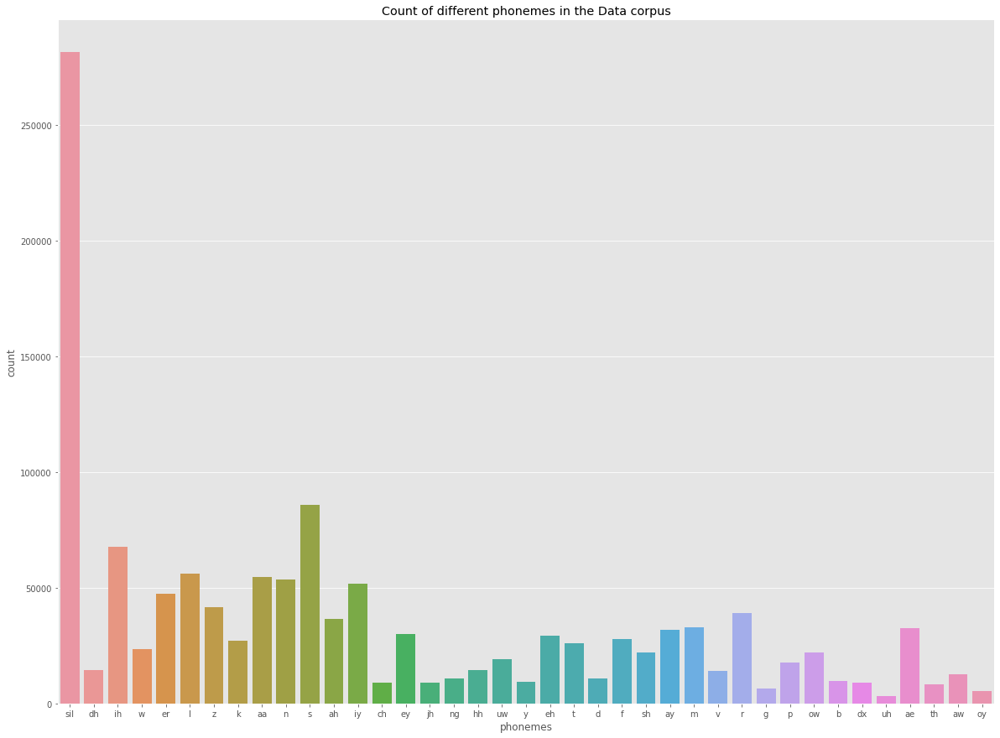

In [0]:
_, axes = plt.subplots(nrows=1,ncols=1,figsize=(20,15))
sns.countplot(x = 'phonemes', data=plot_labels).set_title('Count of different phonemes in the Data corpus')
plt.show()

In [0]:
print('No. of sample in training set : ',len(X_train_full))
print('No. of sample in test set : ',len(X_test_full))
print('Shape of Train data : ',X_train_full.shape,y_train_full.shape)
print('Shape of Test data : ',X_test_full.shape, y_test_full.shape)

No. of sample in training set :  1044183
No. of sample in test set :  261046
Shape of Train data :  (1044183, 13) (1044183, 39)
Shape of Test data :  (261046, 13) (261046, 39)


**Percentage of phonemes in train and test set**

In [0]:
for i in range(0,len(uniq_labels)):
        print("Class ",i,"( ",uniq_labels[i]," )","train labels percentage ",round((sum(y_train_full[:,i])/len(y_train_full))*100, 4)," and test labels percentage ",round((sum(y_test_full[:,i])/len(y_test_full))*100,4))

Class  0 (  aa  ) train labels percentage  4.178  and test labels percentage  4.1778
Class  1 (  ae  ) train labels percentage  2.5009  and test labels percentage  2.5011
Class  2 (  ah  ) train labels percentage  2.8092  and test labels percentage  2.8091
Class  3 (  aw  ) train labels percentage  0.9785  and test labels percentage  0.9784
Class  4 (  ay  ) train labels percentage  2.4286  and test labels percentage  2.4287
Class  5 (  b  ) train labels percentage  0.7404  and test labels percentage  0.7405
Class  6 (  ch  ) train labels percentage  0.6997  and test labels percentage  0.6999
Class  7 (  d  ) train labels percentage  0.8323  and test labels percentage  0.8324
Class  8 (  dh  ) train labels percentage  1.1009  and test labels percentage  1.101
Class  9 (  dx  ) train labels percentage  0.6932  and test labels percentage  0.6934
Class  10 (  eh  ) train labels percentage  2.2392  and test labels percentage  2.2391
Class  11 (  er  ) train labels percentage  3.6338  and t

# Increase Count Method

*   Add countn no of phonemes corresponding to each classn.
*   store that extra added phonemes to xdata and ydata.



In [0]:
def increase_cnt(xdatafull,ydatafull,classn,countn,start_from):
    k=0
    xdata=np.empty([countn,len(full_features[0])])
    ydata=np.empty([countn,len(uniq_labels)])
    while(k<countn):
        if(ydatafull[start_from,classn]==1):
            xdata[k,:]=xdatafull[start_from,:]
            ydata[k,:]=ydatafull[start_from,:]
            k=k+1
        start_from=start_from+1
        
    
    return xdata,ydata

# Train test data method

*   For each classn stack the calculated X_temp & y_temp to X_train and y_train
*   Return the added arrays.



In [0]:
def train_test_data(X_train,y_train,classn,inc_cnt):    
    X_temp,y_temp=increase_cnt(X_train_full,y_train_full,classn,inc_cnt,len(X_train))
    X_train=np.vstack ((X_train, X_temp) ) 
    y_train=np.vstack ((y_train, y_temp) ) 
    return X_train,y_train

# One class train data method

*   Here,x_data and y_data are the previously calculated X_train1 and y_train1 corresponding to a classn from trained svm
*   Now, as in 1-class svm we keep only the data where classn==1 in both the x_data and y_data
*   Store that in xdata and ydata respectively










In [0]:
def oneClassTrainData(x_data,y_data,classn):
    k=0
    xdata=np.empty([int(sum(y_data[:,classn])),len(full_features[0])])
    ydata=np.empty([int(sum(y_data[:,classn])),len(uniq_labels)])
    for i in range(0,len(y_data)):
        if(y_data[i,classn]==1):
            xdata[k,]=x_data[i,]
            ydata[k,]=y_data[i,]
            k=k+1
    return xdata,ydata

# Train 1-class and SVM models

In [0]:
def Train_Models(X_train,y_train,inc_cnt,name):
    svm_models=[]
    oneClass_models=[]
    for i in range(0,len(uniq_labels)):
        X_train1,y_train1=train_test_data(X_train,y_train,i,inc_cnt)
        print("Training Class ",i,"( ",uniq_labels[i]," )","Train count ",sum(y_train1[:,i]))
        clf = svm.SVC(kernel='rbf', C=100,gamma='auto',probability=True,class_weight='balanced')
        svm_models.append(clf.fit(X_train1[:,],y_train1[:,i]))

        #oneClass
        X_train1,y_train1=oneClassTrainData(X_train1,y_train1,i)
        clf_oneClass = OneClassSVM(gamma='auto')
        oneClass_models.append(clf_oneClass.fit(X_train1))
        
    with open(name+"svm_models.pckl", "wb") as f:
        for model in svm_models:
             pickle.dump(model, f)
            
    with open(name+"oneClass_models.pckl", "wb") as f:
        for model in oneClass_models:
             pickle.dump(model, f)

# Bar graph representation of various classes in the data.

In [0]:
def train_test_DataCount(y_train,y_test,inc_cnt):
    train_data_count=[]
    test_data_count=[]
    for i in range(0,len(uniq_labels)):
        print("Class ",i,"( ",uniq_labels[i]," )","Train count ",sum(y_train[:,i]),"Test count ",sum(y_test[:,i]))
        train_data_count.append(sum(y_train[:,i])+inc_cnt)
        test_data_count.append(sum(y_test[:,i]))
    
    barWidth = 0.3  # width of the bars
    bars1 = train_data_count  # Choose the height of the blue bars
    bars2 = test_data_count   # Choose the height of the cyan bars
    r1 = np.arange(len(bars1))   # The x position of bars
    r2 = [x + barWidth for x in r1]
    plt.figure(figsize=(20,5))
    plt.bar(r1, bars1, width = barWidth, color = 'blue', edgecolor = 'black', capsize=7, label='Train')  # Create blue bars
    plt.bar(r2, bars2, width = barWidth, color = 'cyan', edgecolor = 'black', capsize=7, label='Test')  # Create cyan bars
    # general layout
    plt.xticks([r + barWidth for r in range(len(bars1))], uniq_labels)
    plt.ylabel('height')
    plt.legend()

    # Show graphic
    plt.show()

# Test SVM model method

In [0]:
def Test_SVM_Model(xdata,ydata,name):
    svm_models = []
    with open(name+"svm_models.pckl", "rb") as f:
        while True:
            try:
                svm_models.append(pickle.load(f))
            except EOFError:
                break
    score_svm=[]
    probabilities=np.empty([len(xdata),len(uniq_labels)])
    predicted_data_svm=np.empty([len(xdata),len(uniq_labels)])
    y_scores_svm=np.empty([len(xdata),len(uniq_labels)])
    for i in range(0,len(uniq_labels)):
        predicted_data_svm[:,i]=svm_models[i].predict(xdata) # predicted class label by 2 class svm of phoneme i
        score_svm.append(accuracy_score(ydata[:,i],predicted_data_svm[:,i])) # accuracy_score returns the fraction of correctly classified samples
        y_scores_svm[:,i]=svm_models[i].decision_function(xdata) # gives on which side of the hyperplane the points are
        print("SVM Accuracy for class ",i," = ",score_svm[i],"Test count ",sum(ydata[:,i]))
        pdata=svm_models[i].predict_proba(xdata) # predict probabilities of the data belonging to the particular class
        #print(pdata[:10])
        probabilities[:,i]=pdata[:,1]
        
    return y_scores_svm,probabilities

# Test 1-class Model

In [0]:
def Test_oneClass_Models(xdata,ydata,name):
    oneClass_models = []
    with open(name+"oneClass_models.pckl", "rb") as f:
        while True:
            try:
                oneClass_models.append(pickle.load(f))
            except EOFError:
                break
    score_oneClass=[]
    predicted_data_oneClass=np.empty([len(xdata),len(uniq_labels)])
    y_scores_oneClass=np.empty([len(xdata),len(uniq_labels)])
    for i in range(0,len(uniq_labels)):
        predicted_data_oneClass[:,i]=oneClass_models[i].predict(xdata)
        predicted_data_oneClass[:,i]=np.where(predicted_data_oneClass[:,i]==-1.0, 0,predicted_data_oneClass[:,i])
        score_oneClass.append(accuracy_score(ydata[:,i],predicted_data_oneClass[:,i]))
        y_scores_oneClass[:,i]=oneClass_models[i].decision_function(xdata)
        print("OneClass Accuracy for class ",i," = ",score_oneClass[i],"Test count ",sum(ydata[:,i]))
        
    return y_scores_oneClass


# plot ROC curve

In [0]:
def plot_rocCurve(scores,ydata):
    # Compute ROC curve and ROC AUC for each class
    n_classes = len(uniq_labels)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    all_y_test_i = np.array([])
    all_y_predict_proba = np.array([])
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(ydata[:,i], scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot each individual ROC curve
    plt.figure(figsize=(10,10))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(i, roc_auc[i]))

    plt.plot([0, 5], [0, 5], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Some extension of Receiver operating characteristic to multi-class')
    plt.legend(loc="lower right",ncol=2,fontsize="small")
    plt.show()
    return roc_auc

# Run Model case 1

In [0]:
def Run_Model_case1(train_cnt,test_cnt,inc_cnt):    #with appending additional train data
    X_train=X_train_full[:train_cnt,]
    y_train=y_train_full[:train_cnt,]
    X_test=X_test_full
    y_test=y_test_full
    name="case1"
    train_test_DataCount(y_train,y_test,inc_cnt)
    Train_Models(X_train,y_train,inc_cnt,name)

    y_scores_svm,probabilities=Test_SVM_Model(X_test,y_test,name)
    y_scores_oneClass=Test_oneClass_Models(X_test,y_test,name)

    svm_roc_auc=plot_rocCurve(y_scores_svm,y_test)
    oneClass_roc_auc=plot_rocCurve(y_scores_oneClass,y_test)
    return svm_roc_auc,oneClass_roc_auc,probabilities

# Main

Class  0 (  aa  ) Train count  347.0 Test count  10906.0
Class  1 (  ae  ) Train count  171.0 Test count  6529.0
Class  2 (  ah  ) Train count  245.0 Test count  7333.0
Class  3 (  aw  ) Train count  82.0 Test count  2554.0
Class  4 (  ay  ) Train count  188.0 Test count  6340.0
Class  5 (  b  ) Train count  51.0 Test count  1933.0
Class  6 (  ch  ) Train count  58.0 Test count  1827.0
Class  7 (  d  ) Train count  56.0 Test count  2173.0
Class  8 (  dh  ) Train count  81.0 Test count  2874.0
Class  9 (  dx  ) Train count  55.0 Test count  1810.0
Class  10 (  eh  ) Train count  199.0 Test count  5845.0
Class  11 (  er  ) Train count  286.0 Test count  9486.0
Class  12 (  ey  ) Train count  166.0 Test count  6012.0
Class  13 (  f  ) Train count  187.0 Test count  5579.0
Class  14 (  g  ) Train count  44.0 Test count  1327.0
Class  15 (  hh  ) Train count  88.0 Test count  2891.0
Class  16 (  ih  ) Train count  414.0 Test count  13541.0
Class  17 (  iy  ) Train count  287.0 Test count  1

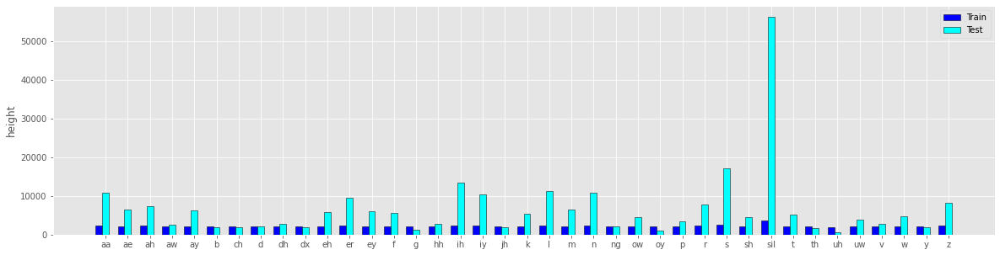

Training Class  0 (  aa  ) Train count  2347.0
Training Class  1 (  ae  ) Train count  2171.0
Training Class  2 (  ah  ) Train count  2245.0
Training Class  3 (  aw  ) Train count  2082.0
Training Class  4 (  ay  ) Train count  2188.0
Training Class  5 (  b  ) Train count  2051.0
Training Class  6 (  ch  ) Train count  2058.0
Training Class  7 (  d  ) Train count  2056.0
Training Class  8 (  dh  ) Train count  2081.0
Training Class  9 (  dx  ) Train count  2055.0
Training Class  10 (  eh  ) Train count  2199.0
Training Class  11 (  er  ) Train count  2286.0
Training Class  12 (  ey  ) Train count  2166.0
Training Class  13 (  f  ) Train count  2187.0
Training Class  14 (  g  ) Train count  2044.0
Training Class  15 (  hh  ) Train count  2088.0
Training Class  16 (  ih  ) Train count  2414.0
Training Class  17 (  iy  ) Train count  2287.0
Training Class  18 (  jh  ) Train count  2049.0
Training Class  19 (  k  ) Train count  2186.0
Training Class  20 (  l  ) Train count  2340.0
Training

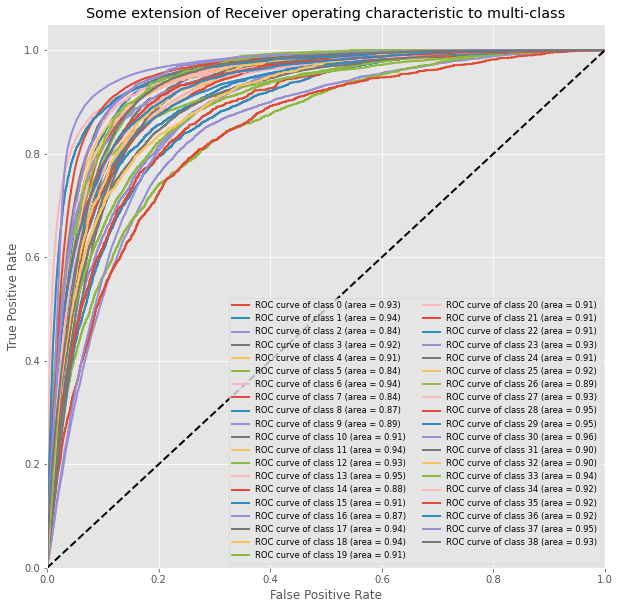

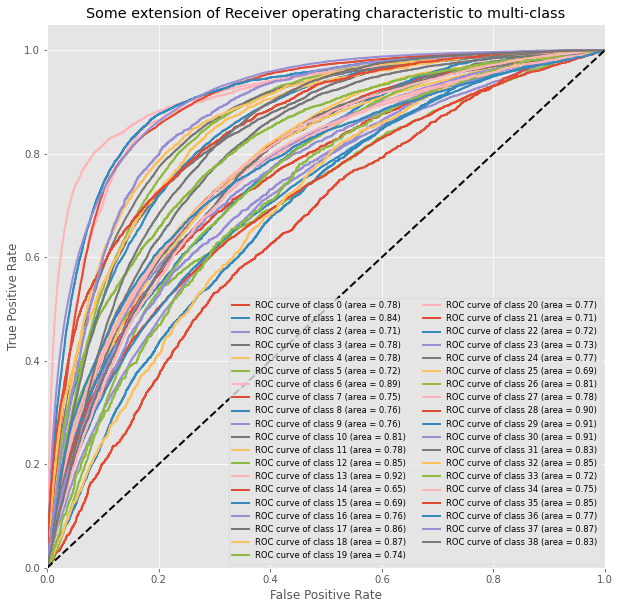

In [0]:
svm_roc_auc_c1,oneClass_roc_auc_c1,probabilities1=Run_Model_case1(8000,1000,2000)